# Final Project: The Extent of Hierarchy in Erdos-Renyi Graphs
### Student: Owen Anderson
### Advisor: Gergely Palla

# Step 1: Generating the Erdos-Renyi graphs
To accomplish this, I used the built-in networkx function "erdos_renyi_graph(N, p, seed=seed, directed=True)", and tested calculations with smaller graphs with different numbers of nodes and probabilities. As I am trying to test the behavior around the percolation point, and we know theoretically that in E-R directed networks this falls around average degree $<k>=1$ (in + out degree). Again, as this is a directed E-R network, this corresponds to $p = \frac{1}{2(N-1)}$. Using this, I then tested the graphs when $<k>$ was between $<k>=0.8$ and $<k>=1.2$, calculating Global Reaching Centrality, links not participating in cycles, and suceptibility. 

**question** when saying "links not participating in cycles", are you referring to edges that are not part of the large weakly connected component, or any links that aren't in cycles more generally?

# Imports (comment out those unused)

In [1]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
import time
from networkx import connected_components, weakly_connected_components, simple_cycles
from collections import Counter
from collections import defaultdict
from datetime import datetime
from scipy import stats

# Generating a directed erdos-renyi graph

In [2]:
def directed_er_graph(N, p):
    # Get the current time as the seed value, and initialize the random number generator with the current time as the seed
    seed_value = int(time.time())
    random.seed(seed_value)
    G = nx.erdos_renyi_graph(N, p, directed=True, seed=seed_value)
    return G

In [3]:
# test of defined function, making sure edges are generated properly in directed vs. undirected
N = 1000
p = 1/((2*N)-2)
pnot = 1/(N-1)
print(p)
network = directed_er_graph(N, p)
t2 = nx.erdos_renyi_graph(N, pnot, directed=False)
print(network)
print(t2)

0.0005005005005005005
DiGraph with 1000 nodes and 473 edges
Graph with 1000 nodes and 483 edges


# Step 2: Defining Calculation of Metrics

## Global Reaching Centrality

1. calculate C_r(i) for every node
2. find which is the maximum
3. for every index, subtract that from the minimum and divide by N, then sum all of these and divide by N - 1

equation in words: for every node, subtract its out degree/total nodes - 1 from the maximum node value, sum, and then divide by N-1 to normalize

## Defining Functions for Metrics Tracking

### Local Reaching Centrality

In [4]:
def local_reaching_centrality(network, node):
    # Get the set of reachable nodes using descendants function
    reachable_nodes = nx.descendants(network, node)

    # NOTE: might not need to do this line every time, as this does not change within a single graph  
    N = network.number_of_nodes()

    # Return the local reaching centrality value
    return len(reachable_nodes) / (N - 1) if N > 1 else 0

In [5]:
def global_reaching_centrality(network):
    # Calculate the local reaching centrality for each node
    reaching_centralities = [local_reaching_centrality(network, node) for node in network.nodes]

    # Find the maximum local reaching centrality value
    max_reaching_centrality = max(reaching_centralities)

    # Take the sum of each local reaching centrality subtracted from the max reaching centrality
    sum_reaching_centrality = sum([max_reaching_centrality - reaching_centrality for reaching_centrality in reaching_centralities])

    # Divide by N - 1
    N = network.number_of_nodes()

    # Return this sum divided by N - 1, to normalize the value (this is our global reaching centrality value)
    return sum_reaching_centrality / (N - 1) if N > 1 else 0


In [6]:
global_reaching_centrality(network)

0.0072174276378479995

### OR just use networkx

In [7]:
nx.global_reaching_centrality(network)

0.0072174276378479995

### Calculating Susceptibility

In [13]:
def calc_susceptibility(network):
    connected_components = nx.weakly_connected_components(network)
    comp_sizes = [len(comp) for comp in connected_components]
    sorted_comp_sizes = sorted(comp_sizes, reverse=True)
    chi = 0
    if len(sorted_comp_sizes) > 1:
        print(comp_sizes)
        chi = sum(comp_size ** 2 for comp_size in sorted_comp_sizes[1:])
        chi /= len(sorted_comp_sizes)
    
    return chi

### Average Degree Calculation (to make sure k was being calculated properly)

In [14]:
# Add nodes and edges to G...
def average_node_degree(graph):
    # Calculate the total degree (in-degree plus out-degree) for each node
    total_degrees = [graph.in_degree(node) + graph.out_degree(node) for node in graph.nodes()]
    # Calculate the average total degree per node
    return sum(total_degrees) / graph.number_of_nodes() if graph.number_of_nodes() > 0 else 0

### Edgeflow – Fraction of Links Not Participating in Cycles 

#### My approach:

In [15]:
def fraction_links_not_in_cycles(graph):
    # Step 1: Identify all directed cycles
    cycles = list(nx.simple_cycles(graph))
    
    # Step 2: Create a set of edges participating in cycles
    edges_in_cycles = set()
    for cycle in cycles:
        for i in range(len(cycle)):
            edge = (cycle[i], cycle[(i + 1) % len(cycle)])  # Wrap around to form edge from last node to first
            edges_in_cycles.add(edge)
    
    total_edges = graph.number_of_edges()
    edges_not_in_cycles = total_edges - len(edges_in_cycles)
    fraction_not_in_cycles = edges_not_in_cycles / total_edges
    
    return fraction_not_in_cycles


#### Approach provided by Professor Palla:

In [16]:
def extract_links_in_cycles(graph):
    total_edges = len(graph.edges())
    graph_copy = graph.copy()
    changed = True
    
    while changed:
        changed = False
        nodes_to_remove = [node for node in graph_copy.nodes() if graph_copy.in_degree(node) == 0 or graph_copy.out_degree(node) == 0]
        edges_to_remove = [edge for node in nodes_to_remove for edge in graph_copy.edges(node)]

        # NOTE: don't need this line, as we remove edges when the nodes are removed in the line below.
        for edge in edges_to_remove:
            if graph_copy.has_edge(edge[0], edge[1]):  # Check if the edge exists in the graph
                graph_copy.remove_edge(edge[0], edge[1])
                changed = True

        for node in nodes_to_remove:
            graph_copy.remove_node(node)
            changed = True
    
    num_links_in_cycles = graph_copy.number_of_edges()
    nx.draw(graph_copy)
    return (total_edges - num_links_in_cycles) / total_edges if total_edges > 0 else 0


### OR just use networkx

In [17]:
nx.flow_hierarchy(network)

1.0

## Edgeflow and GRC on LCC only

1.0
0.17065556711758575


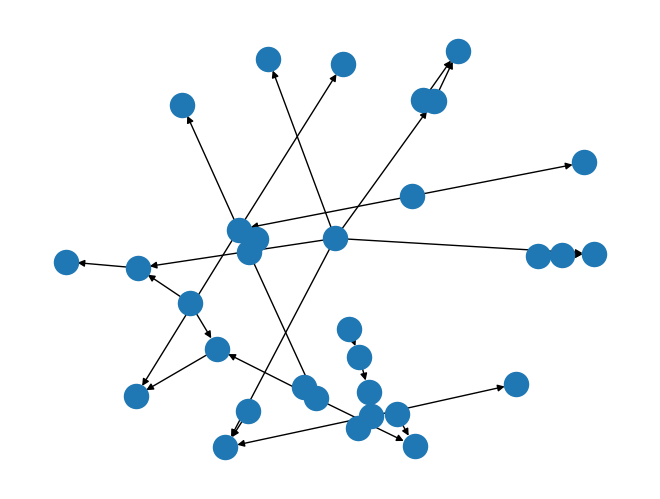

In [27]:
# Global reaching centrality on the LCC only
def global_reaching_centrality_LCC(network):
    largest_cc = max(nx.weakly_connected_components(network), key=len)
    return nx.global_reaching_centrality(network.subgraph(largest_cc))

# Edgeflow hierarchy on the LCC only   
def edgeflow_hierarchy(network):
    largest_cc = max(nx.weakly_connected_components(network), key=len)
    nx.flow_hierarchy(network.subgraph(largest_cc))
    nx.draw(network.subgraph(largest_cc))
    return nx.flow_hierarchy(network.subgraph(largest_cc))

print(edgeflow_hierarchy(network))
print(global_reaching_centrality_LCC(network))

## Reach distribution

In [28]:
def reach_distribution(N, k, iterations=10):
    reach_centralities = []
    for _ in range(iterations):
        reach_dist_net = directed_er_graph(N, k/(2*N-2))
        reach_centralities.extend([local_reaching_centrality(reach_dist_net, node) for node in reach_dist_net.nodes()])
    return reach_centralities

# Step 3: Simulations

### Simulation with 2000 nodes

In [29]:
# range of degrees we want to test
avg_total_degrees = np.arange(0.5,1.4,0.01)

N, length = 2000, 50

average_node_degrees = []
global_reaching_centralities = []
total_not_in_cycles = []
susceptibilities = []

for deg in avg_total_degrees:

    temp_node_degree = []
    temp_num_links_not_in_cycles = []
    temp_reaching_centrality = []
    temp_susceptibility = []

    temp_node_degree.clear()
    temp_num_links_not_in_cycles.clear()
    temp_reaching_centrality.clear()
    temp_susceptibility.clear()
    
    for i in range(length):
        n = directed_er_graph(N, deg/(2*N-2))
        temp_node_degree.append(average_node_degree(n))
        temp_num_links_not_in_cycles.append(fraction_links_not_in_cycles(n))
        temp_reaching_centrality.append(global_reaching_centrality(n))
        temp_susceptibility.append(calc_susceptibility(n))
    
    average_node_degrees.append(np.mean(temp_node_degree))
    total_not_in_cycles.append(np.mean(temp_num_links_not_in_cycles))
    global_reaching_centralities.append(np.mean(temp_reaching_centrality))
    susceptibilities.append(np.mean(temp_susceptibility))


[1, 2, 1, 3, 1, 7, 1, 1, 1, 1, 1, 1, 5, 1, 1, 2, 1, 1, 5, 2, 2, 1, 8, 15, 1, 1, 1, 1, 1, 1, 2, 7, 1, 2, 2, 3, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 11, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1, 2, 1, 2, 1, 2, 4, 3, 1, 1, 3, 2, 1, 3, 3, 2, 1, 1, 1, 3, 1, 1, 1, 2, 5, 1, 4, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 4, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 5, 5, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 8, 3, 3, 4, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 3, 1, 1, 2, 3, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 2, 3, 2, 1, 1, 2, 1, 1, 1, 4, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 3, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1, 1, 2, 1, 1, 1, 1, 3, 1, 2, 1, 1, 1, 2, 1, 1, 2, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 2, 5, 3, 1, 1, 6, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1

### Reach distributions plotted individually

In [30]:
N = 1000
ks = [0.8, 1.0, 1.2]
reach_dist_08 = reach_distribution(N, ks[0])
k = 1.0
reach_dist_10 = reach_distribution(N, ks[1])
k = 1.2
reach_dist_12 = reach_distribution(N, ks[2])

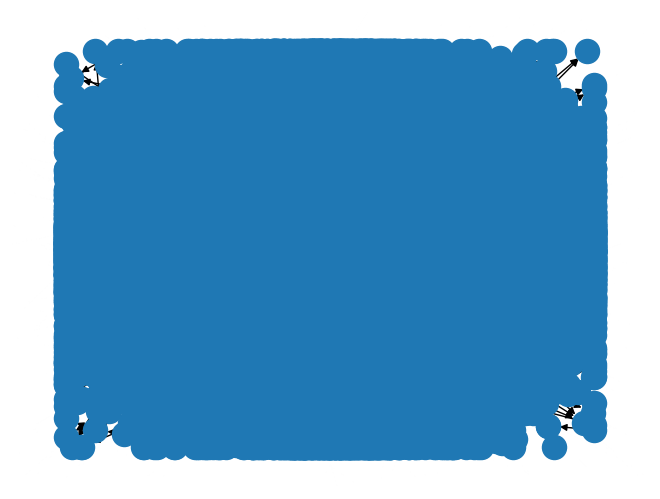

In [31]:
# range of degrees we want to test
avg_total_degrees = np.arange(0.5,1.4,0.01)

# NOTE: could improve efficiency simply by adding a parameter to be the number of nodes (if runtime is an issue)

N, length = 1000, 10

grcs = []
edgeflows = []

for deg in avg_total_degrees:

    temp_grc = []
    temp_edgeflow = []

    temp_grc.clear()
    temp_edgeflow.clear()
    
    for i in range(length):
        n = directed_er_graph(N, deg/(2*N-2))
        
        temp_grc.append(global_reaching_centrality_LCC(n))
        temp_edgeflow.append(edgeflow_hierarchy(n))
    
    grcs.append(np.mean(temp_grc))
    edgeflows.append(np.mean(temp_edgeflow))


### Plots

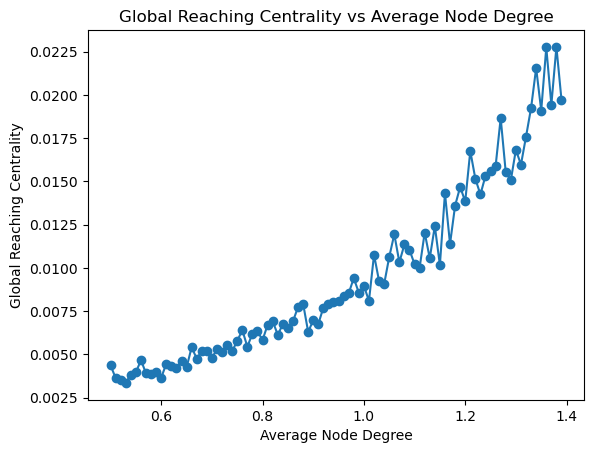

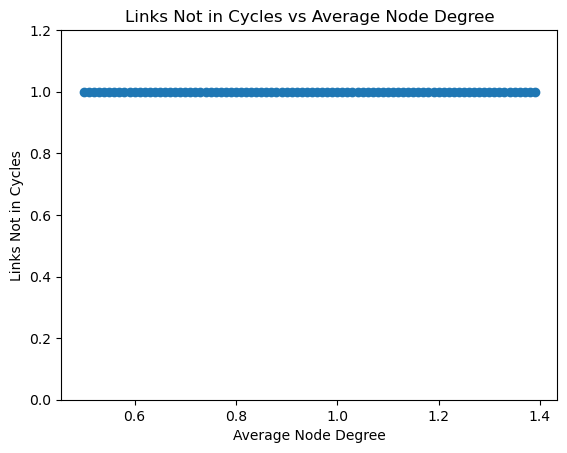

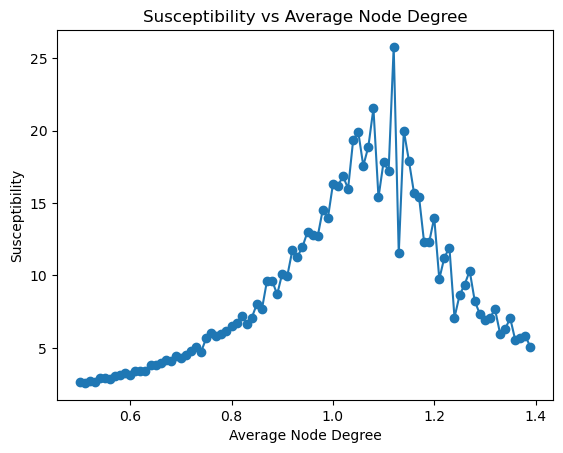

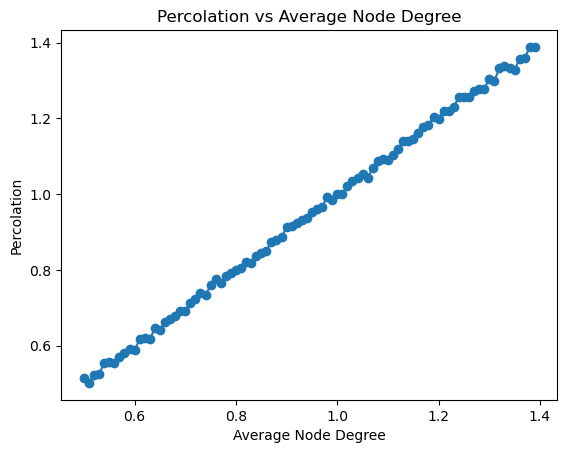

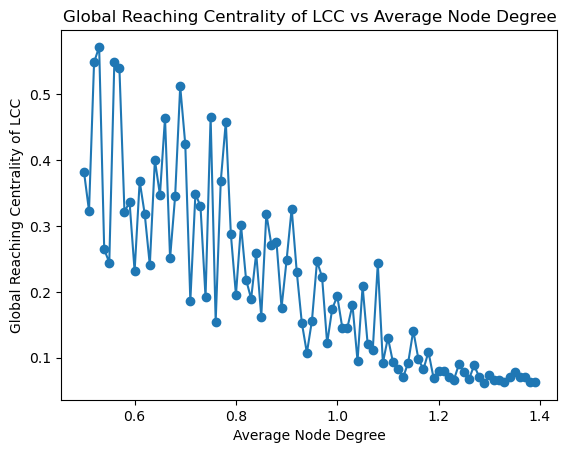

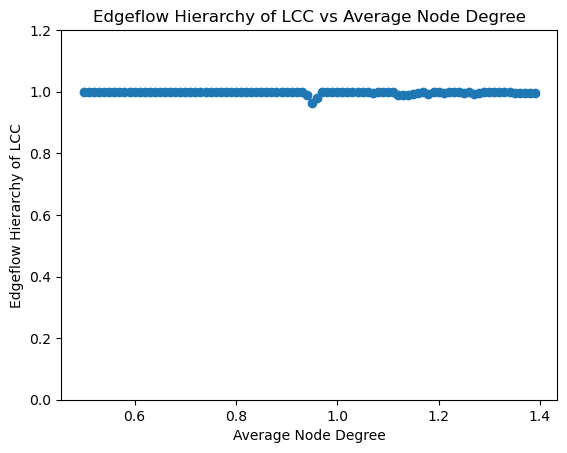

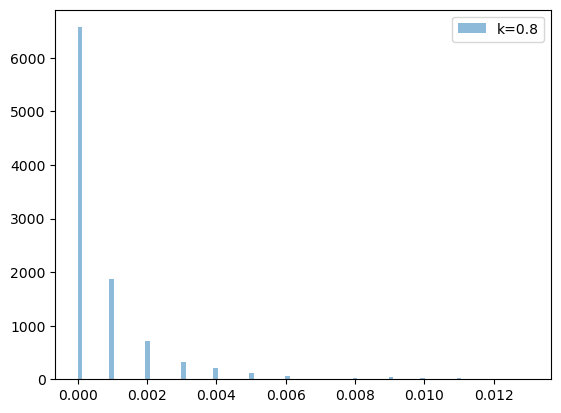

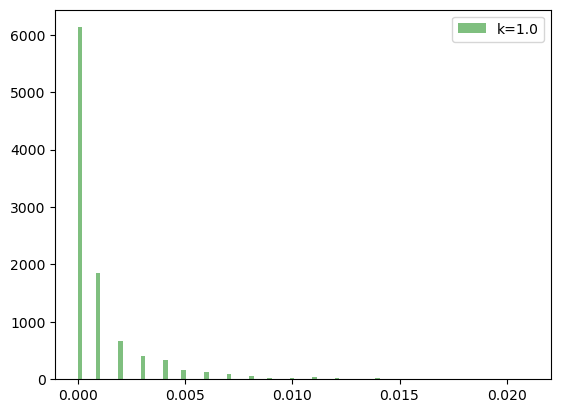

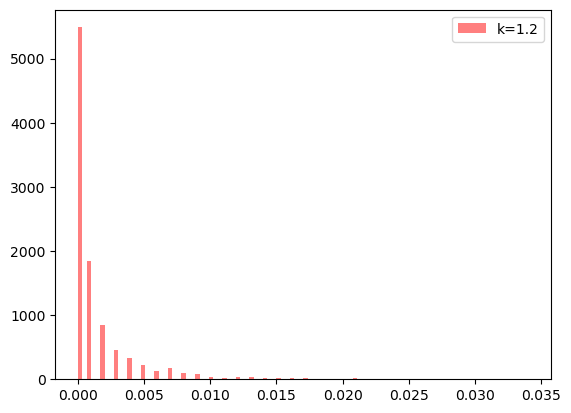

In [32]:
# graph for global reaching centrality:
plt.plot(avg_total_degrees, global_reaching_centralities, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Global Reaching Centrality')
plt.title('Global Reaching Centrality vs Average Node Degree')
plt.show()

# graph for links not in cycles (edgeflow):
plt.plot(avg_total_degrees, total_not_in_cycles, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Links Not in Cycles')
plt.title('Links Not in Cycles vs Average Node Degree')
plt.ylim(0, 1.2)
plt.show()

# graph for susceptibility:
plt.plot(avg_total_degrees, susceptibilities, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Susceptibility')
plt.title('Susceptibility vs Average Node Degree')
plt.show()

# graph for average node degrees (not needed):
plt.plot(avg_total_degrees, average_node_degrees, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Percolation')
plt.title('Percolation vs Average Node Degree')
plt.show()

# graph for global reaching centrality of largest component:
plt.plot(avg_total_degrees, grcs, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Global Reaching Centrality of LCC')
plt.title('Global Reaching Centrality of LCC vs Average Node Degree')
plt.show()

# graph for edgeflow hierarchy of largest component:
plt.plot(avg_total_degrees, edgeflows, '-o')
plt.xlabel('Average Node Degree')
plt.ylabel('Edgeflow Hierarchy of LCC')
plt.title('Edgeflow Hierarchy of LCC vs Average Node Degree')
plt.ylim(0, 1.2)
plt.show()

# plot the results in a normalized historgram
plt.hist(reach_dist_08, bins=100, alpha=0.5, label='k=0.8')
plt.legend(loc='upper right')
plt.show()

plt.hist(reach_dist_10, bins=100, alpha=0.5, label='k=1.0', color="green")
plt.legend(loc='upper right')
plt.show()

plt.hist(reach_dist_12, bins=100, alpha=0.5, label='k=1.2', color="red")
plt.legend(loc='upper right')
plt.show()

### Reach distributions plotted together

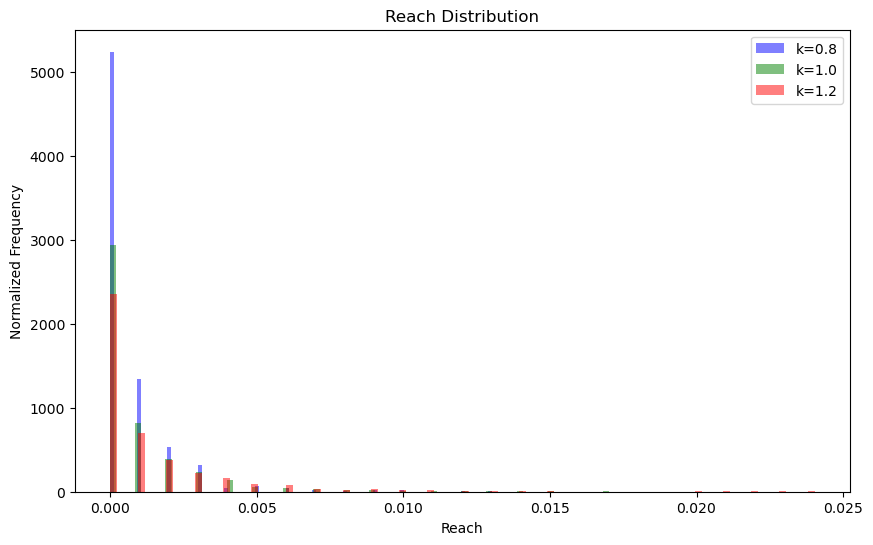

In [33]:
# Set parameters
N = 1000
ks = [0.8, 1.0, 1.2]

# Run the function for each k value and collect results
reach_distributions = {k: reach_distribution(N, k) for k in ks}

# Plot the results in a normalized histogram
plt.figure(figsize=(10, 6))
colors = ["blue", "green", "red"]
for i, k in enumerate(ks):
    plt.hist(reach_distributions[k], bins=100, alpha=0.5, label=f'k={k}', color=colors[i], density=True)

plt.legend(loc='upper right')
plt.title('Reach Distribution')
plt.xlabel('Reach')
plt.ylabel('Normalized Frequency')
plt.show()
